In [1]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;


<IPython.core.display.Javascript object>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt  

#change the path as needed
stellar = pd.read_csv("/Users/jady/Desktop/UTD/semester2/6341 Machine Learning_Lidong Wu/project/star_classification.csv")


# Initial Data Exploration

In [3]:
#Get the screenshot of the data to get a basic understanding
stellar.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [4]:
#Renaming the columns for better understanding of the data
updated_columns = {'alpha': 'right_ascension_angle',
               'delta': 'decline_angle',
               'u': 'ultraviolet_filter',
                'g': 'green_filter',
                  'r': 'red_filter',
                  'i':'near_infra_filter',
                  'z':'infra_filter', 'MJD': 'modified_julian_date'}

stellar = stellar.rename(columns=updated_columns)

In [5]:
#Check the data types
print(stellar.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   obj_ID                 100000 non-null  float64
 1   right_ascension_angle  100000 non-null  float64
 2   decline_angle          100000 non-null  float64
 3   ultraviolet_filter     100000 non-null  float64
 4   green_filter           100000 non-null  float64
 5   red_filter             100000 non-null  float64
 6   near_infra_filter      100000 non-null  float64
 7   infra_filter           100000 non-null  float64
 8   run_ID                 100000 non-null  int64  
 9   rerun_ID               100000 non-null  int64  
 10  cam_col                100000 non-null  int64  
 11  field_ID               100000 non-null  int64  
 12  spec_obj_ID            100000 non-null  float64
 13  class                  100000 non-null  object 
 14  redshift               100000 non-nul

In [6]:
#check the spread of the data in the columns
print(stellar.describe())

             obj_ID  right_ascension_angle  decline_angle  ultraviolet_filter  \
count  1.000000e+05          100000.000000  100000.000000       100000.000000   
mean   1.237665e+18             177.629117      24.135305           21.980468   
std    8.438560e+12              96.502241      19.644665           31.769291   
min    1.237646e+18               0.005528     -18.785328        -9999.000000   
25%    1.237659e+18             127.518222       5.146771           20.352353   
50%    1.237663e+18             180.900700      23.645922           22.179135   
75%    1.237668e+18             233.895005      39.901550           23.687440   
max    1.237681e+18             359.999810      83.000519           32.781390   

        green_filter     red_filter  near_infra_filter   infra_filter  \
count  100000.000000  100000.000000      100000.000000  100000.000000   
mean       20.531387      19.645762          19.084854      18.668810   
std        31.750292       1.854760           1.757

# Data Cleaning

In [7]:
# Find missing values
missing_values = stellar.isnull().sum()
print("Missing Values:")
print(missing_values)

Missing Values:
obj_ID                   0
right_ascension_angle    0
decline_angle            0
ultraviolet_filter       0
green_filter             0
red_filter               0
near_infra_filter        0
infra_filter             0
run_ID                   0
rerun_ID                 0
cam_col                  0
field_ID                 0
spec_obj_ID              0
class                    0
redshift                 0
plate                    0
modified_julian_date     0
fiber_ID                 0
dtype: int64


In [8]:
# Find duplicates
duplicate_rows = stellar.duplicated()
print("\nDuplicate Rows:")
print(stellar[duplicate_rows])


Duplicate Rows:
Empty DataFrame
Columns: [obj_ID, right_ascension_angle, decline_angle, ultraviolet_filter, green_filter, red_filter, near_infra_filter, infra_filter, run_ID, rerun_ID, cam_col, field_ID, spec_obj_ID, class, redshift, plate, modified_julian_date, fiber_ID]
Index: []


# Exploratory Data Analysis

### Univariate Analysis

In [9]:
#check for count of classes
stellar['class'].value_counts()

class
GALAXY    59445
STAR      21594
QSO       18961
Name: count, dtype: int64

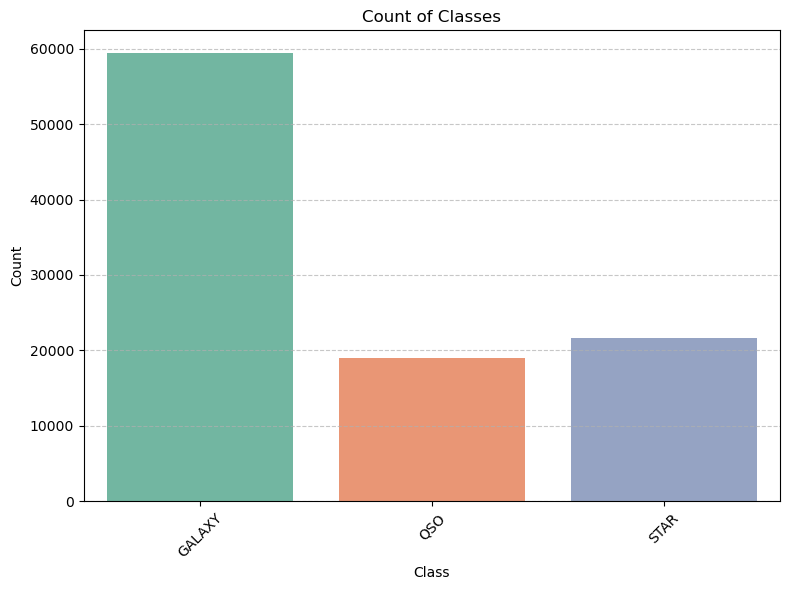

In [10]:
#plot to check for balance in data entry for the 3 classes 
import seaborn as sns
import matplotlib.pyplot as plt
class_counts = stellar['class'].value_counts()

plt.figure(figsize=(8, 6))
sns.countplot(data=stellar, x='class', palette='Set2')
plt.title('Count of Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

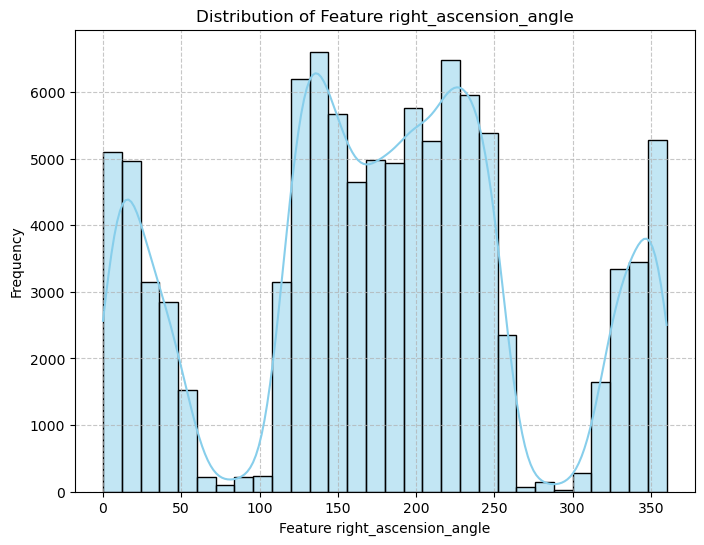

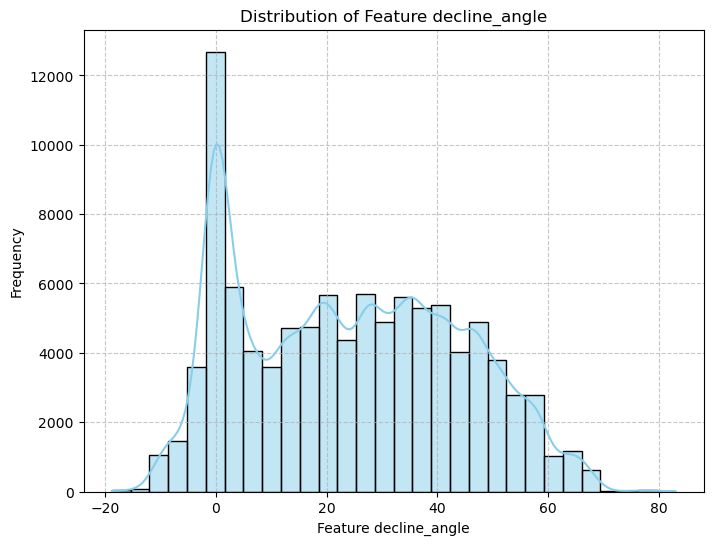

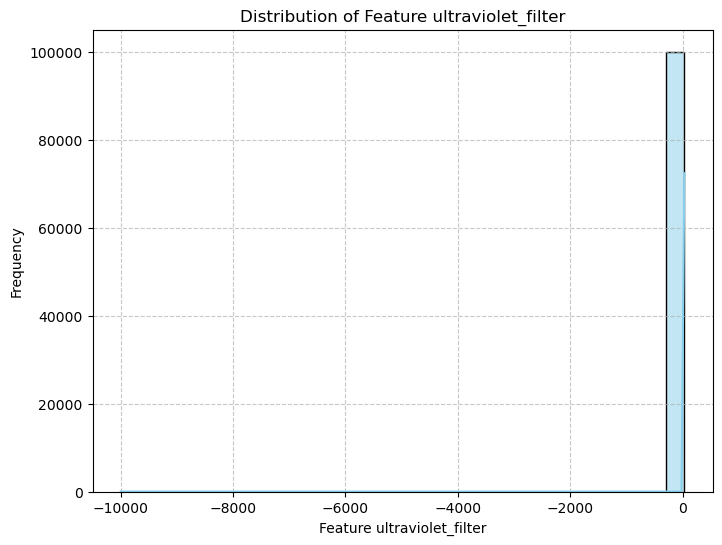

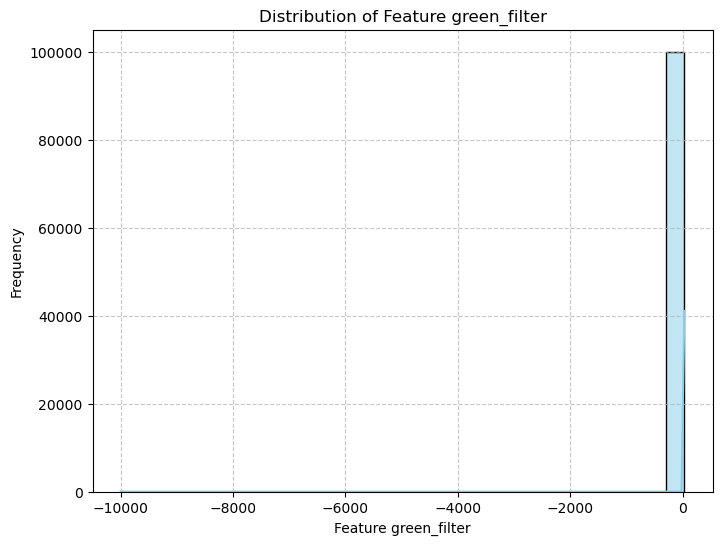

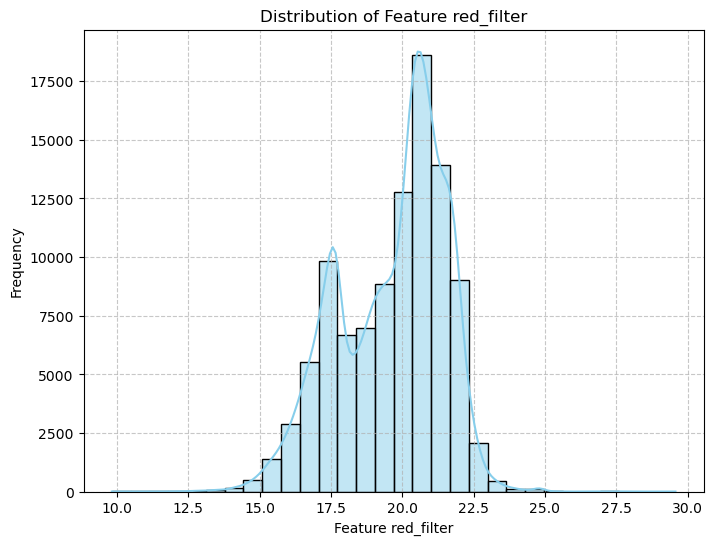

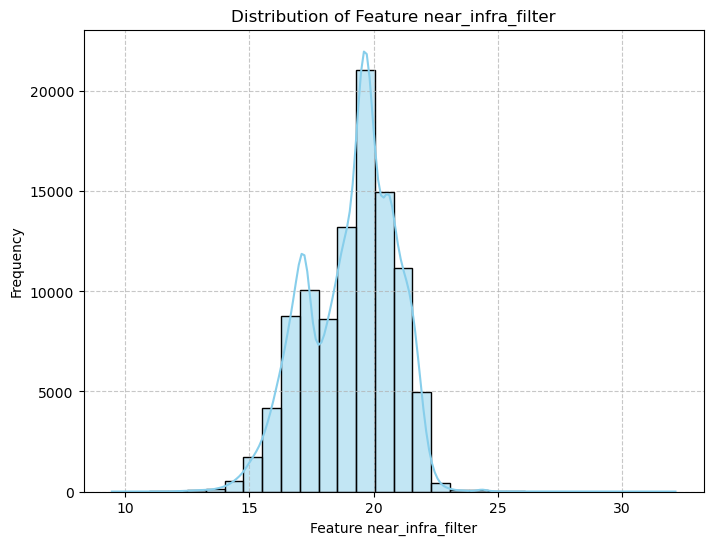

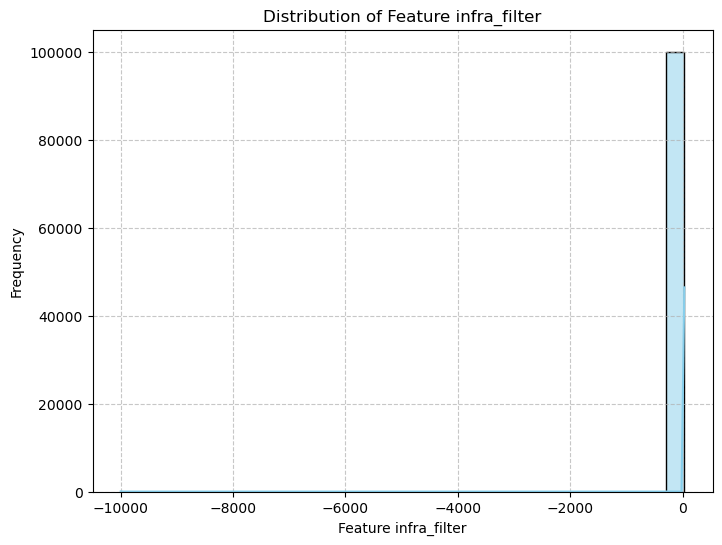

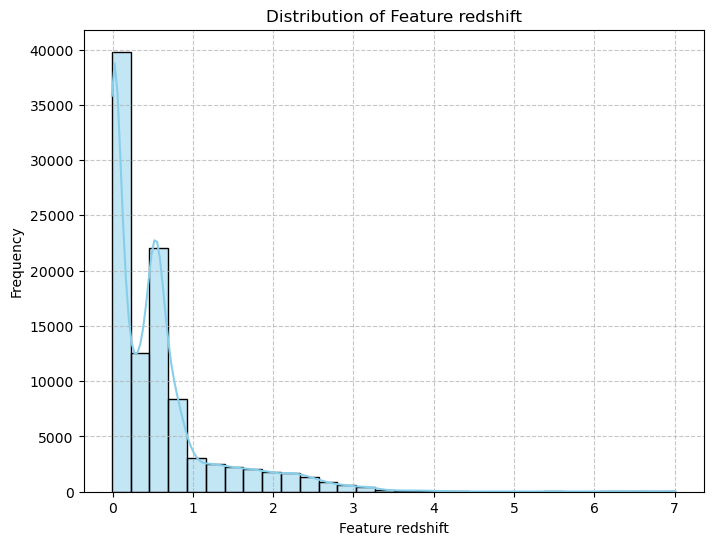

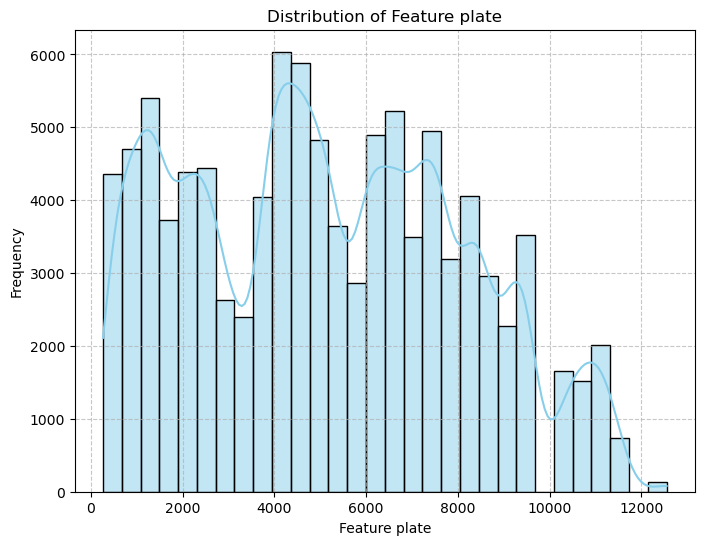

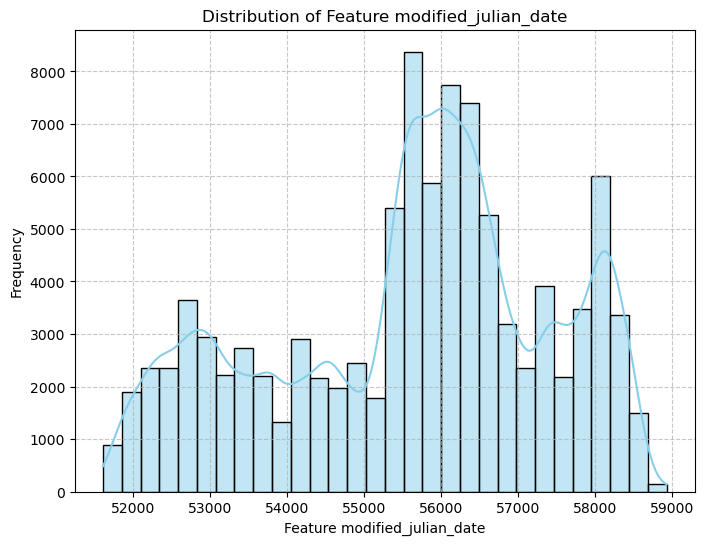

In [12]:
#histogram of individual variables
import seaborn as sns
import matplotlib.pyplot as plt

def plot_histograms(data, columns_of_interest, bins=30, figsize=(8, 6), color='skyblue'):
    for column in columns_of_interest:
        plt.figure(figsize=figsize)
        sns.histplot(data=data, x=column, bins=bins, color=color, kde=True)
        plt.title(f'Distribution of Feature {column}')
        plt.xlabel(f'Feature {column}')
        plt.ylabel('Frequency')
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.show()
## Note that in this histogram the class value are string value, so when the python drowt this plot it 
#mean the frequency of those class value
stellar_columns_of_interest = ['right_ascension_angle', 'decline_angle', 'ultraviolet_filter', 
                               'green_filter', 'red_filter', 'near_infra_filter', 'infra_filter','redshift', 
                               'plate', 'modified_julian_date']

plot_histograms(data=stellar, columns_of_interest=stellar_columns_of_interest)


In [13]:
#transforming the variables to fix skewness
import pandas as pd
import numpy as np
from sklearn.preprocessing import PowerTransformer
import matplotlib.pyplot as plt
import seaborn as sns
 
#Apply Yeo-Johnson transformation
pt = PowerTransformer(method='yeo-johnson')
transformed_data = pt.fit_transform(stellar[stellar_columns_of_interest].dropna())
stellar[stellar_columns_of_interest] = pd.DataFrame(transformed_data, columns=stellar_columns_of_interest)


In [14]:
print(stellar)

             obj_ID  right_ascension_angle  decline_angle  ultraviolet_filter  \
0      1.237661e+18              -0.365523       0.491932            0.788783   
1      1.237665e+18              -0.271008       0.438599            1.213369   
2      1.237661e+18              -0.298177       0.625074            1.446720   
3      1.237663e+18               1.559116      -1.280465           -0.006312   
4      1.237680e+18               1.616778      -0.021024           -1.163941   
...             ...                    ...            ...                 ...   
99995  1.237679e+18              -1.458924      -1.522970            0.007409   
99996  1.237679e+18              -1.593352      -0.087262            0.242687   
99997  1.237668e+18               0.515625      -0.289110           -0.431824   
99998  1.237661e+18               0.397926       1.084753            1.488987   
99999  1.237661e+18               0.249310       1.197333            0.211277   

       green_filter  red_fi

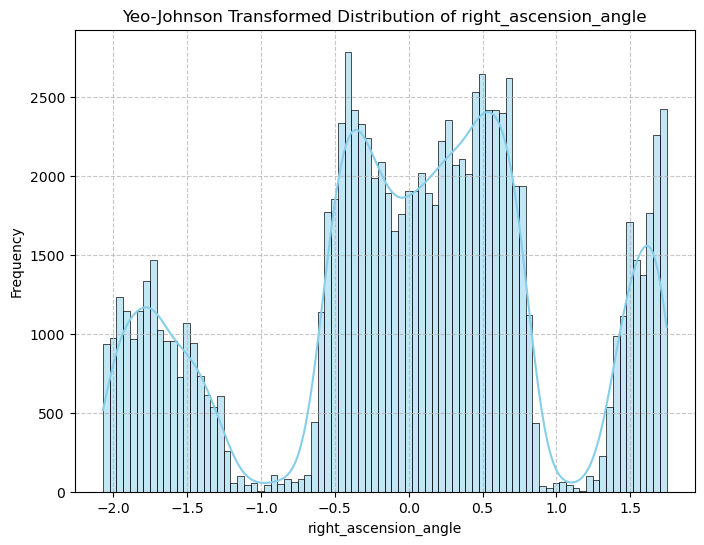

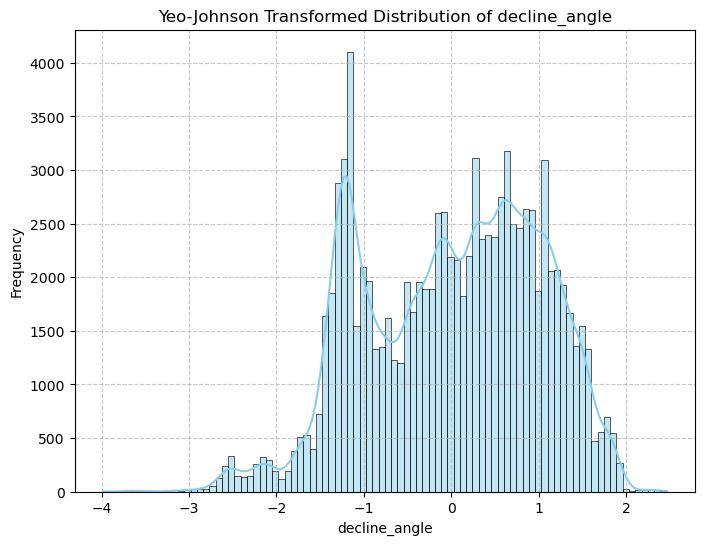

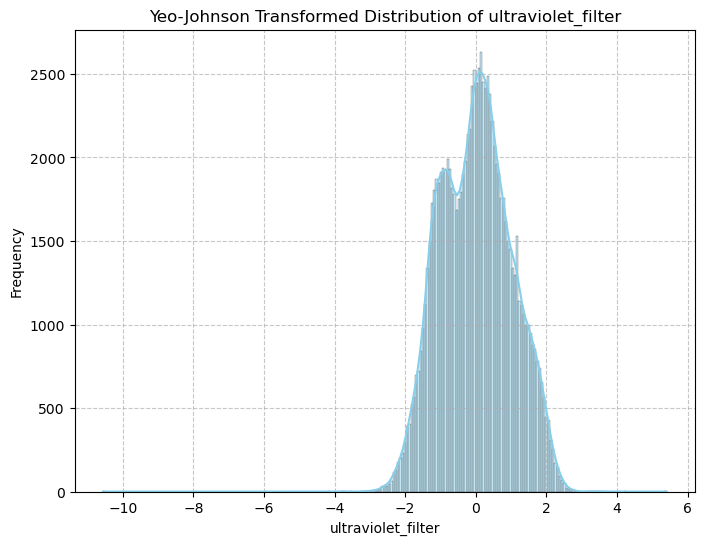

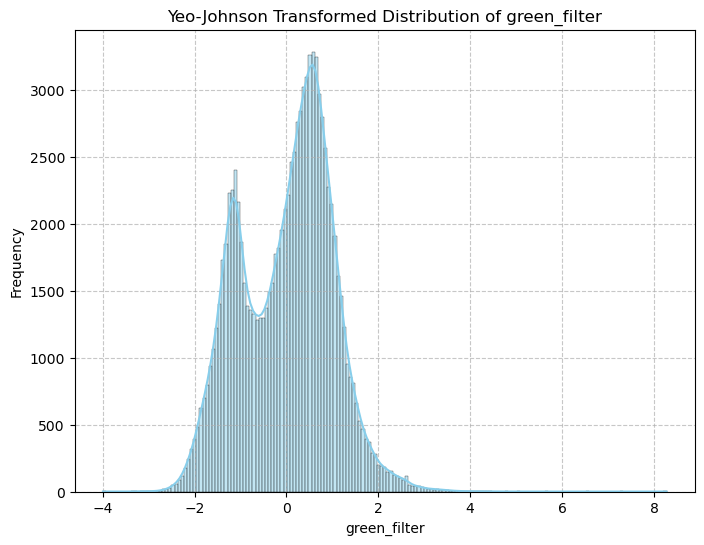

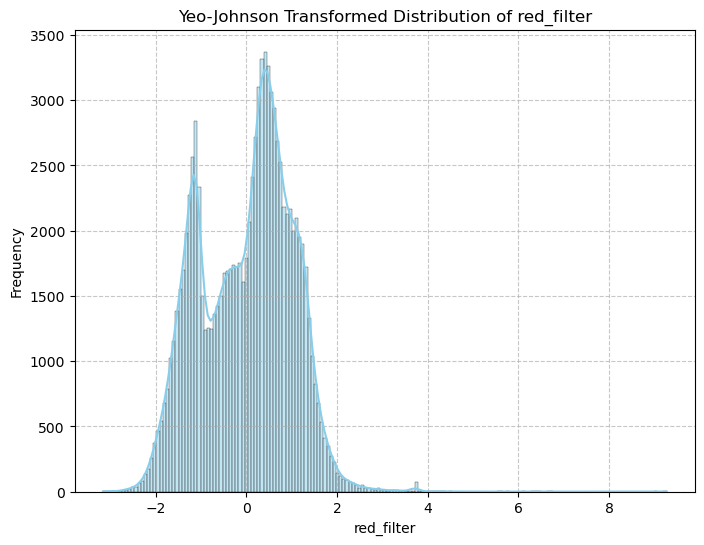

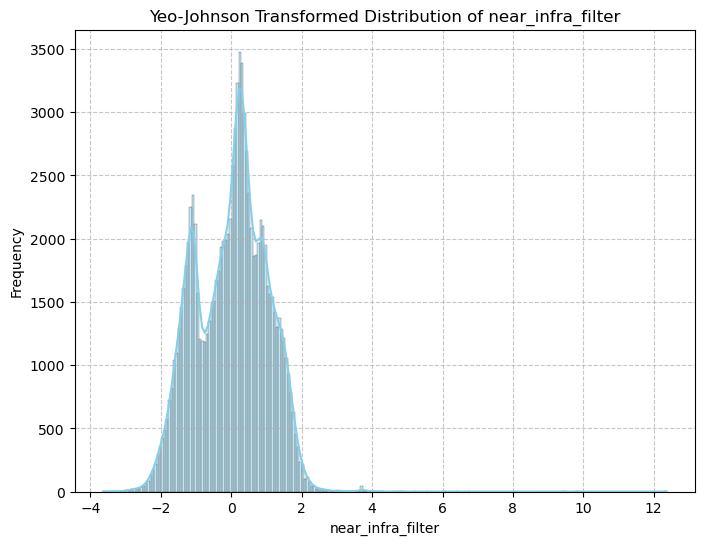

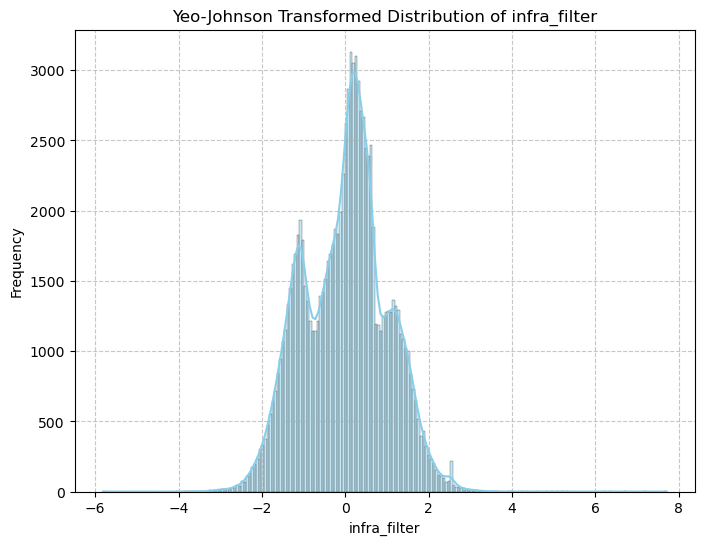

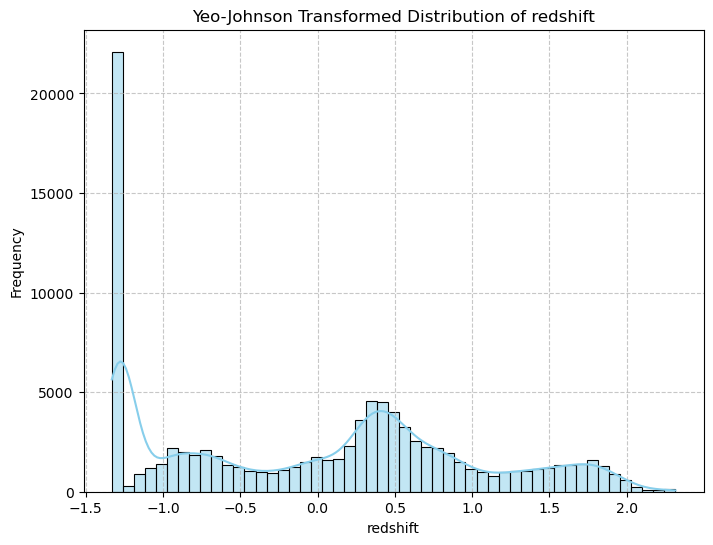

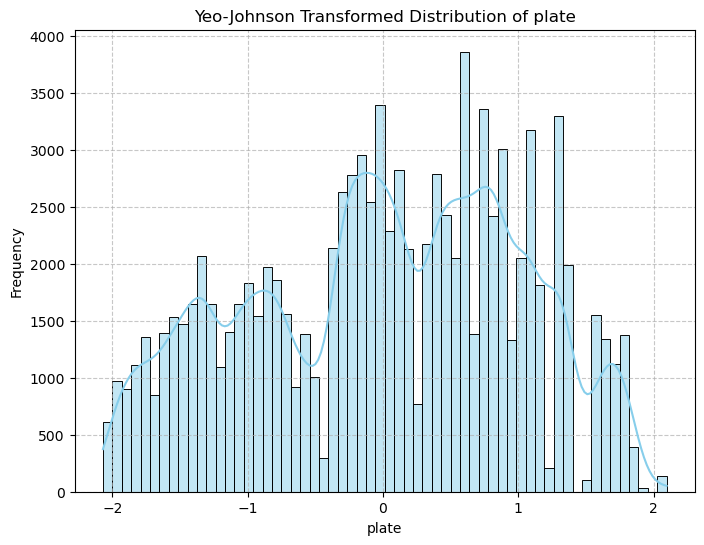

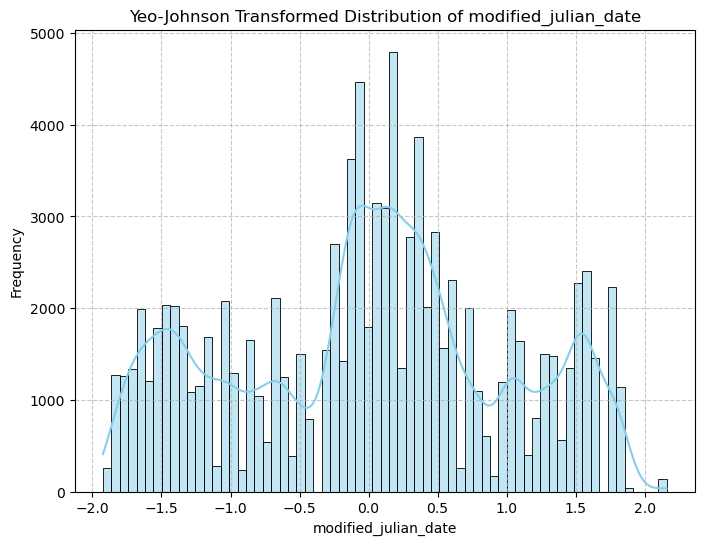

In [15]:
# Plot histograms of the transformed data
def plot_transformed_histograms(stellar, columns_of_interest):
    for column in columns_of_interest:
        plt.figure(figsize=(8, 6))
        sns.histplot(stellar[column], kde=True, color='skyblue')
        plt.title(f'Yeo-Johnson Transformed Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.show()
 
plot_transformed_histograms(stellar, stellar_columns_of_interest)

In [16]:
import pandas as pd

# Note that in this data class are string column and it can't be used to caculate the statistical value 
#so we only extract the int and float
numeric_columns = stellar.select_dtypes(include=['int', 'float']).columns

mean_values = stellar[numeric_columns].mean()

median_values = stellar[numeric_columns].median()

mode_values = stellar[numeric_columns].mode().iloc[0]  

std_values = stellar[numeric_columns].std()

variance_values = stellar[numeric_columns].var()

quartile_values = stellar[numeric_columns].quantile([0.25, 0.5, 0.75])

# Calculating range
range_values = stellar[numeric_columns].max() - stellar[numeric_columns].min()

# Calculating min and max
min_values = stellar[numeric_columns].min()
max_values = stellar[numeric_columns].max()

## Also include the skewness and kurtosis
skewness_values = stellar[numeric_columns].skew()

kurtosis_values = stellar[numeric_columns].kurtosis()

summary_stats = pd.DataFrame({
    'Mean': mean_values,
    'Median': median_values,
    'Mode': mode_values,
    'Std': std_values,
    'Variance': variance_values,
    '25th Percentile': quartile_values.loc[0.25],
    '50th Percentile': quartile_values.loc[0.5],
    '75th Percentile': quartile_values.loc[0.75],
    'Range': range_values,
    'Min': min_values,
    'Max': max_values,
    'Skewness': skewness_values,
    'Kurtosis': kurtosis_values
})

print(summary_stats)


                               Mean        Median          Mode           Std  \
obj_ID                 1.237665e+18  1.237663e+18  1.237659e+18  8.438560e+12   
right_ascension_angle  1.836042e-16  9.244306e-02 -1.522722e+00  1.000005e+00   
decline_angle         -3.694822e-17  9.461337e-02 -1.300357e+00  1.000005e+00   
ultraviolet_filter     8.341772e-16  1.256040e-02  1.145197e+00  1.000005e+00   
green_filter          -4.901324e-16  1.549252e-01  2.613171e+00  1.000005e+00   
red_filter             1.342926e-16  1.683028e-01  3.713954e+00  1.000005e+00   
near_infra_filter      2.389555e-16  1.128343e-01  3.724032e+00  1.000005e+00   
infra_filter           8.318324e-16  8.914473e-02  2.519804e+00  1.000005e+00   
run_ID                 4.481366e+03  4.188000e+03  3.699000e+03  1.964765e+03   
rerun_ID               3.010000e+02  3.010000e+02  3.010000e+02  0.000000e+00   
cam_col                3.511610e+00  4.000000e+00  4.000000e+00  1.586912e+00   
field_ID               1.861

## Multivariate Analysis

### Stellar Data Scatter Plot with Categorical Classes


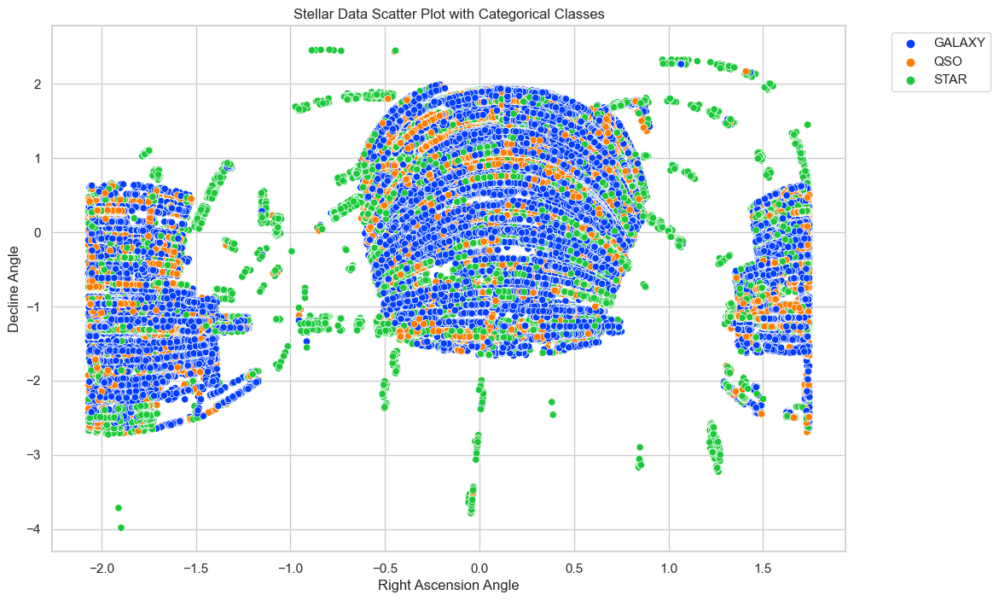

In [17]:
# Scatter plot based on Ascension Angle and Decline angle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming stellar is your DataFrame containing the data
# Replace 'stellar' with the actual name of your DataFrame if different
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

# Create scatter plot with seaborn
scatter = sns.scatterplot(data=stellar, x='right_ascension_angle', y='decline_angle', hue='class', palette='bright')

plt.xlabel('Right Ascension Angle')
plt.ylabel('Decline Angle')
plt.title('Stellar Data Scatter Plot with Categorical Classes')

# Move the legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()


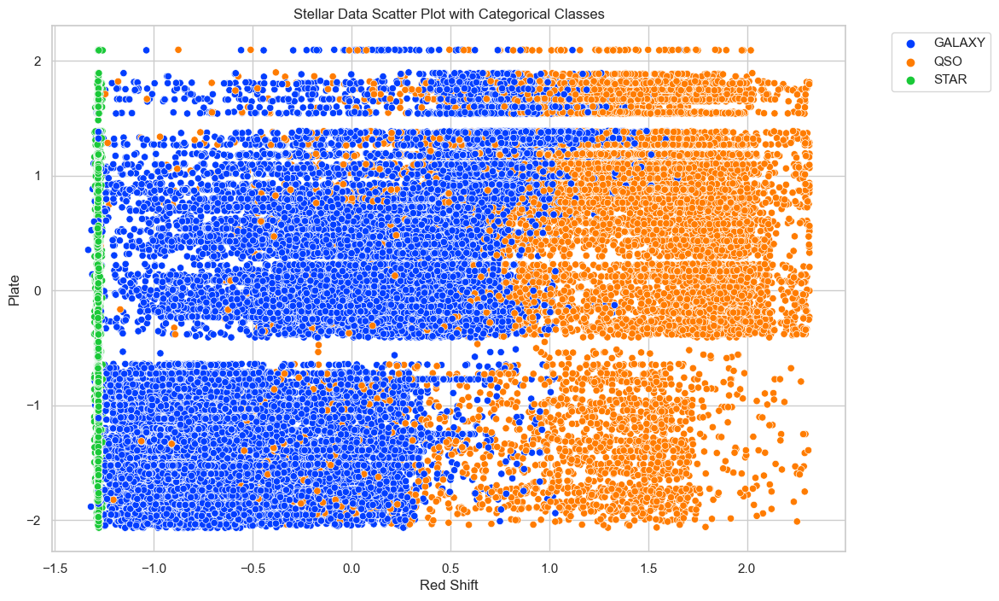

In [18]:
# Scatter plot based on red shift and plate
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming stellar is your DataFrame containing the data
# Replace 'stellar' with the actual name of your DataFrame if different
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

# Create scatter plot with seaborn
scatter = sns.scatterplot(data=stellar, x='redshift', y='plate', hue='class', palette='bright')

plt.xlabel('Red Shift')
plt.ylabel('Plate')
plt.title('Stellar Data Scatter Plot with Categorical Classes')

# Move the legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

## Correlation Analysis

In [19]:
# check for correlation
columns_of_interest = ['right_ascension_angle', 'decline_angle', 'ultraviolet_filter','green_filter','red_filter', 'near_infra_filter', 'infra_filter','redshift','plate','modified_julian_date']
stellarFeatures = stellar[columns_of_interest]

correlation_matrix = stellarFeatures.corr()
print(correlation_matrix)


                       right_ascension_angle  decline_angle  \
right_ascension_angle               1.000000       0.197985   
decline_angle                       0.197985       1.000000   
ultraviolet_filter                 -0.007458      -0.018403   
green_filter                       -0.023831       0.001822   
red_filter                         -0.034201      -0.002983   
near_infra_filter                  -0.034695      -0.001918   
infra_filter                       -0.034747      -0.003963   
redshift                           -0.005171       0.041138   
plate                              -0.004802       0.126408   
modified_julian_date                0.004255       0.114854   

                       ultraviolet_filter  green_filter  red_filter  \
right_ascension_angle           -0.007458     -0.023831   -0.034201   
decline_angle                   -0.018403      0.001822   -0.002983   
ultraviolet_filter               1.000000      0.830885    0.691879   
green_filter          

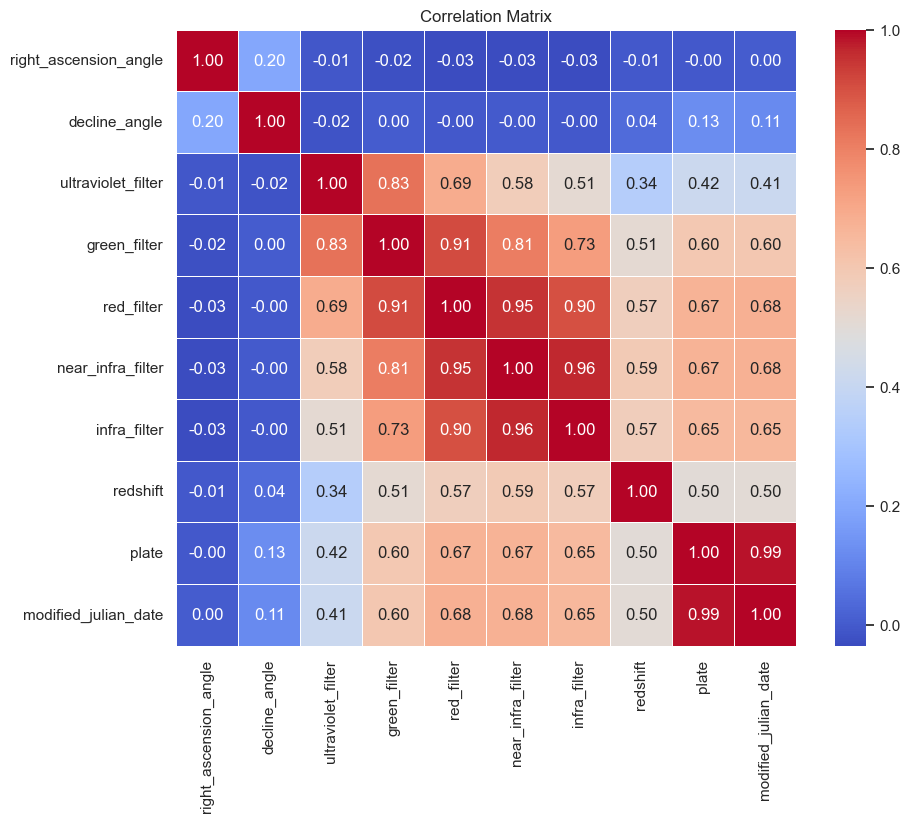

In [20]:
# Correlation Heatmap
correlation_matrix = stellarFeatures.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# Supervised Models

## KNN Model

### Data Splitting

In [21]:
# splitting data 
from sklearn.model_selection import train_test_split

# defining feature and target variables
# not considering features which are ID's
X = stellarFeatures  # Features
y = stellar['class']

#splitting the data into testing and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)


### Model Training

In [22]:
# MODEL 1 
# KNN Classification 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# Initialize KNN classifier
knn = KNeighborsClassifier(n_neighbors=3)

# Fit the classifier to the training data
knn.fit(X_train, y_train)

# Predict on the test data
knn_y_pred = knn.predict(X_test)
#print(knn_y_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, knn_y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9607


In [23]:
# MODEL 1 with grid search for KNN
# KNN Classification 
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Create a pipeline with a scaler and kNN classifier
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Standardize features
    ('knn', KNeighborsClassifier())  # kNN classifier
])

# Define the parameter grid for grid search
param_grid = {
    'knn__n_neighbors': [3, 5, 7],  # Number of neighbors
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)


# Predict on the test data
knn_grid_y_pred = grid_search.predict(X_test)

# Print the best parameters and best score found by grid search
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
test_accuracy = best_model.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)

Best Parameters: {'knn__n_neighbors': 5}
Best Score: 0.9595222222222223
Test Accuracy: 0.9607


Confusion Matrix:
 [[5739   58  107]
 [ 169 1712    6]
 [  53    0 2156]]


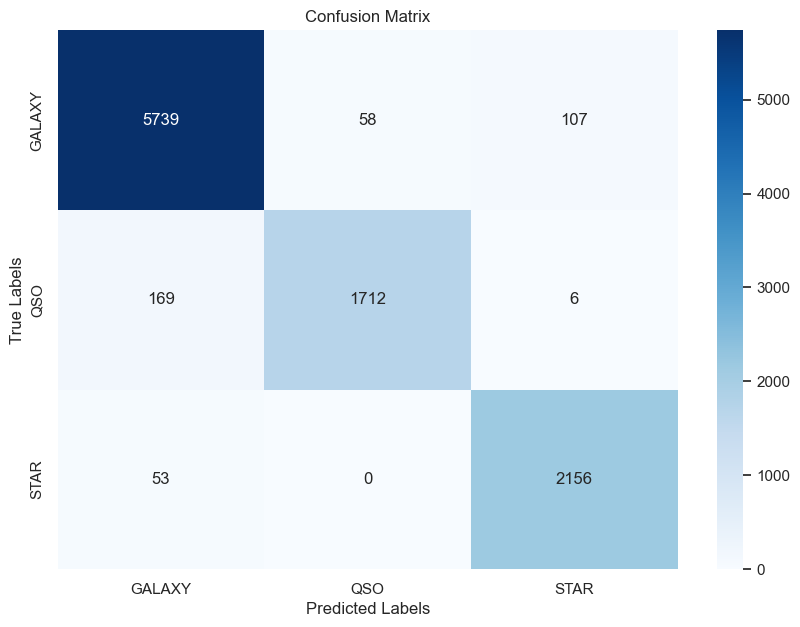

Classification Report:
               precision    recall  f1-score   support

      GALAXY       0.96      0.97      0.97      5904
         QSO       0.97      0.91      0.94      1887
        STAR       0.95      0.98      0.96      2209

    accuracy                           0.96     10000
   macro avg       0.96      0.95      0.96     10000
weighted avg       0.96      0.96      0.96     10000



In [24]:
# classification report for KNN
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# confusion matrix
conf_matrix = confusion_matrix(y_test, knn_grid_y_pred)
print("Confusion Matrix:\n", conf_matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#classification report
class_report = classification_report(y_test, knn_grid_y_pred)
print("Classification Report:\n", class_report)


###    KNN Classification Report


| Class     | Precision | Recall | F1-Score | Support |
|-----------|-----------|--------|----------|---------|
| GALAXY    | 0.96      | 0.97   | 0.97     | 5904    |
| QSO       | 0.97      | 0.91   | 0.94     | 1887    |
| STAR      | 0.95      | 0.98   | 0.96     | 2209    |
| **Accuracy** |       |        | 0.96     | 10000   |
| **Macro Avg** | 0.96 | 0.95   | 0.96     | 10000   |
| **Weighted Avg** | 0.96 | 0.96 | 0.96     | 10000   |


## Decision Tree Model

In [25]:
# Model 2
# Decision Tree
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

opt_tree = DecisionTreeClassifier(random_state = 42)

dt_params = {'max_depth':  range(1,10)         ,
             'min_samples_split':   range(2,11),
             'max_leaf_nodes':    range(2,11)   }

grid_tree = GridSearchCV(opt_tree, dt_params)
grid_tree.fit(X_train, y_train)

# Predict on the test data
dt_y_pred = grid_tree.predict(X_test)

# Print the best parameters and best score found by grid search
print("Best Parameters:", grid_tree.best_params_)
print("Best Score:", grid_tree.best_score_)

# Evaluate the best model on the test set
best_tree_model = grid_tree.best_estimator_
tree_test_accuracy = best_tree_model.score(X_test, y_test)
print("Test Accuracy:", tree_test_accuracy)

Best Parameters: {'max_depth': 4, 'max_leaf_nodes': 10, 'min_samples_split': 2}
Best Score: 0.9652222222222223
Test Accuracy: 0.9665


Decision Tree Confusion Matrix:
 [[5829   65   10]
 [ 260 1627    0]
 [   0    0 2209]]


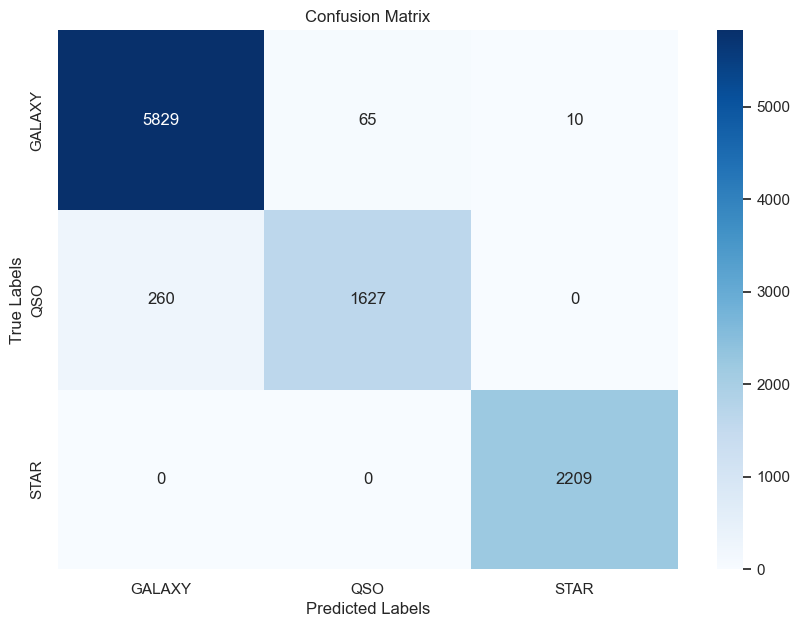

Decision Tree Classification Report:
               precision    recall  f1-score   support

      GALAXY       0.96      0.99      0.97      5904
         QSO       0.96      0.86      0.91      1887
        STAR       1.00      1.00      1.00      2209

    accuracy                           0.97     10000
   macro avg       0.97      0.95      0.96     10000
weighted avg       0.97      0.97      0.97     10000



In [26]:
# classification report for Decision tree
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# confusion matrix
conf_matrix = confusion_matrix(y_test, dt_y_pred)
print("Decision Tree Confusion Matrix:\n", conf_matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#classification report
class_report = classification_report(y_test, dt_y_pred)
print("Decision Tree Classification Report:\n", class_report)


###    Decision Tree Classification Report


| Class     | Precision | Recall | F1-Score | Support |
|-----------|-----------|--------|----------|---------|
| GALAXY    | 0.96      | 0.99   | 0.97     | 5904    |
| QSO       | 0.96      | 0.86   | 0.91     | 1887    |
| STAR      | 1.00      | 1.00   | 1.00     | 2209    |
| **Accuracy** |       |        | 0.97     | 10000   |
| **Macro Avg** | 0.97 | 0.95   | 0.96     | 10000   |
| **Weighted Avg** | 0.97 | 0.97 | 0.97     | 10000   |


In [27]:
# Model 3
# Run the random forest classifier
from sklearn.ensemble import RandomForestClassifier

rnd_clf = RandomForestClassifier(n_estimators = 100, max_samples = 0.7, random_state=42)
rnd_clf.fit(X_train, y_train)
print(rnd_clf.score(X_test, y_test))

0.9792


In [28]:
# Model 3 Hyper Parameter tuning
# Random forest hyperparameters
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

rf = RandomForestClassifier(random_state=42)
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_samples': [0.5, 0.7, 0.9]  
}

# RandomizedSearchCV
rnd_search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=5, 
                                cv=3, scoring='accuracy', verbose=1, n_jobs=2, random_state=42)
rnd_search.fit(X_train, y_train)


# Predict on the test data
rnd_y_pred = rnd_search.predict(X_test)

# Print best parameters and best cross validation score
print("Best parameters:", rnd_search.best_params_)
print("Best cross-validation score: {:.2f}".format(rnd_search.best_score_))

# Obtain best model
best_rf = rnd_search.best_estimator_

# Test the accuracy on test data set
test_accuracy = best_rf.score(X_test, y_test)
print("Test set accuracy: {:.2f}".format(test_accuracy))

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Best parameters: {'n_estimators': 200, 'max_samples': 0.9}
Best cross-validation score: 0.98
Test set accuracy: 0.98


Random Forest Confusion Matrix:
 [[5835   57   12]
 [ 140 1747    0]
 [   1    0 2208]]


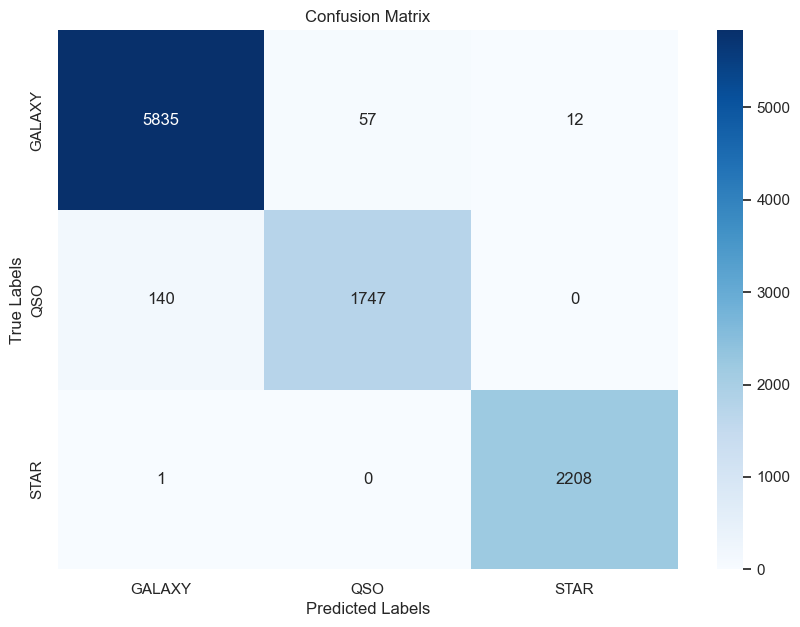

Random Forest Classification Report:
               precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.98      5904
         QSO       0.97      0.93      0.95      1887
        STAR       0.99      1.00      1.00      2209

    accuracy                           0.98     10000
   macro avg       0.98      0.97      0.98     10000
weighted avg       0.98      0.98      0.98     10000



In [29]:
# classification report for Random Forest
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# confusion matrix
conf_matrix = confusion_matrix(y_test, rnd_y_pred)
print("Random Forest Confusion Matrix:\n", conf_matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#classification report
class_report = classification_report(y_test, rnd_y_pred)
print("Random Forest Classification Report:\n", class_report)


###    Random Forest Classification Report



| Class     | Precision | Recall | F1-Score | Support |
|-----------|-----------|--------|----------|---------|
| GALAXY    | 0.98      | 0.99   | 0.98     | 5904    |
| QSO       | 0.97      | 0.93   | 0.95     | 1887    |
| STAR      | 0.99      | 1.00   | 1.00     | 2209    |
| **Accuracy** |       |        | 0.98     | 10000   |
| **Macro Avg** | 0.98 | 0.97   | 0.98     | 10000   |
| **Weighted Avg** | 0.98 | 0.98 | 0.98     | 10000   |


# AdaBoost Model

In [30]:
# Model 4
# Run the adaboost classifier
from sklearn.ensemble import AdaBoostClassifier
dtc = DecisionTreeClassifier(max_depth=4) 
ada_boost_model = AdaBoostClassifier(base_estimator=dtc, n_estimators = 100, learning_rate=0.1, random_state=42)
ada_boost_model.fit(X_train, y_train)
print(ada_boost_model.score(X_test, y_test))

/Users/jady/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


0.8093


In [31]:
## Hyperparameter tuning for ada boosting

from sklearn.model_selection import RandomizedSearchCV
opt_tree = DecisionTreeClassifier(max_depth=4, random_state = 42)
# Initialize AdaBoost with the opt_tree estimator
ada_boost = AdaBoostClassifier(base_estimator=opt_tree, random_state=42)

# Define the parameter grid
param_dist = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.1, 0.5, 1.0]
}

# Create RandomizedSearchCV object
ada_rnd_search = RandomizedSearchCV(ada_boost, param_distributions=param_dist, 
                                    n_iter=5, cv=5, scoring='accuracy', n_jobs = 2, random_state=42)

# Fit RandomizedSearchCV
ada_rnd_search.fit(X_train, y_train)


# Predict on the test data
ada_rnd_y_pred = ada_rnd_search.predict(X_test)

# Print best parameters and best score
print("Best parameters:", ada_rnd_search.best_params_)
print("Best cross-validation score: {:.2f}".format(ada_rnd_search.best_score_))

# Retrieve the best model
best_ada_model = ada_rnd_search.best_estimator_

# Evaluate the best model on the test set
test_accuracy = best_ada_model.score(X_test, y_test)
print("Test set accuracy: {:.2f}".format(test_accuracy))

/Users/jady/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/Users/jady/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/Users/jady/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/Users/jady/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/Users/jady/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.w

Best parameters: {'n_estimators': 100, 'learning_rate': 0.1}
Best cross-validation score: 0.93
Test set accuracy: 0.81


Ada Boost Random Forest Confusion Matrix:
 [[5835   57   12]
 [ 140 1747    0]
 [   1    0 2208]]


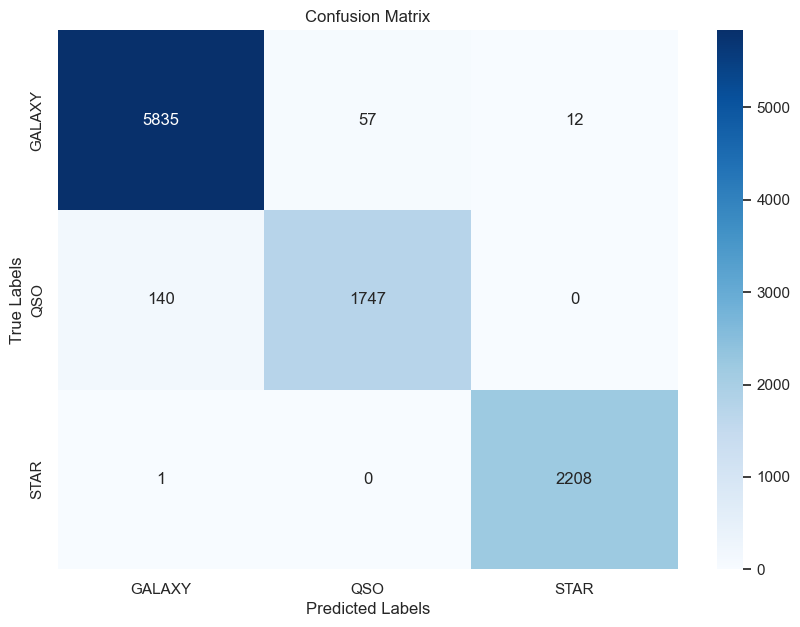

Ada Boost Random Forest Classification Report:
               precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.98      5904
         QSO       0.97      0.93      0.95      1887
        STAR       0.99      1.00      1.00      2209

    accuracy                           0.98     10000
   macro avg       0.98      0.97      0.98     10000
weighted avg       0.98      0.98      0.98     10000



In [32]:
# classification report for Ada Boost Random Forest
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# confusion matrix
conf_matrix = confusion_matrix(y_test, rnd_y_pred)
print("Ada Boost Random Forest Confusion Matrix:\n", conf_matrix)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=knn.classes_, yticklabels=knn.classes_)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#classification report
class_report = classification_report(y_test, rnd_y_pred)
print("Ada Boost Random Forest Classification Report:\n", class_report)


###    Ada Boost Random Forest Classification Report



| Class     | Precision | Recall | F1-Score | Support |
|-----------|-----------|--------|----------|---------|
| GALAXY    | 0.98      | 0.99   | 0.98     | 5904    |
| QSO       | 0.97      | 0.93   | 0.95     | 1887    |
| STAR      | 0.99      | 1.00   | 1.00     | 2209    |
| **Accuracy** |       |        | 0.98     | 10000   |
| **Macro Avg** | 0.98 | 0.97   | 0.98     | 10000   |
| **Weighted Avg** | 0.98 | 0.98 | 0.98     | 10000   |


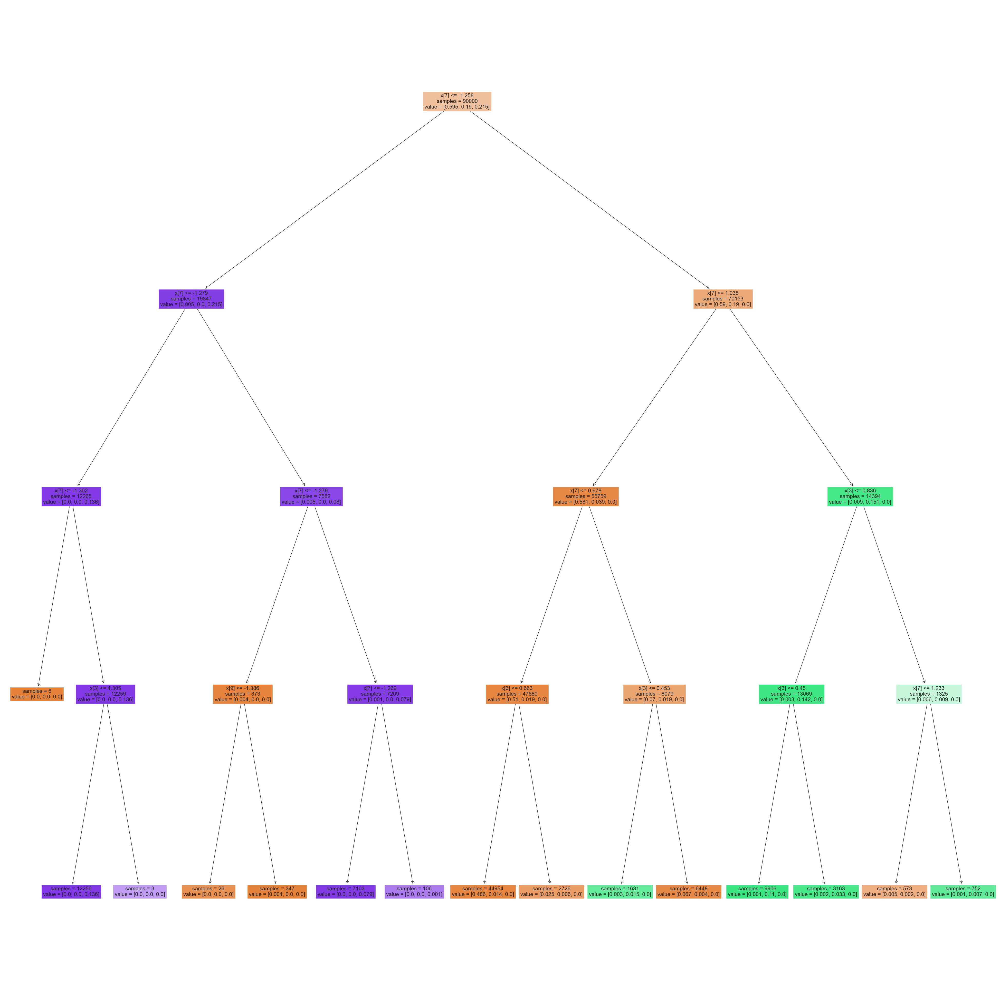

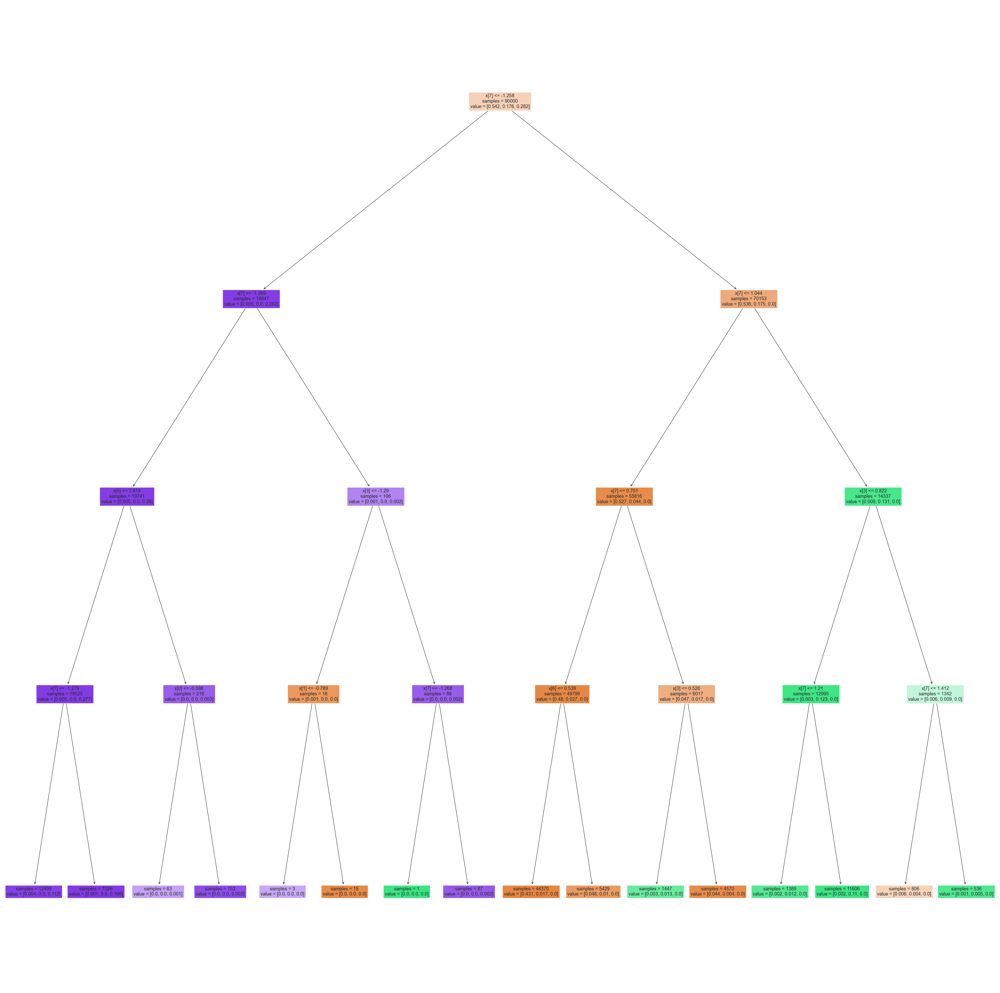

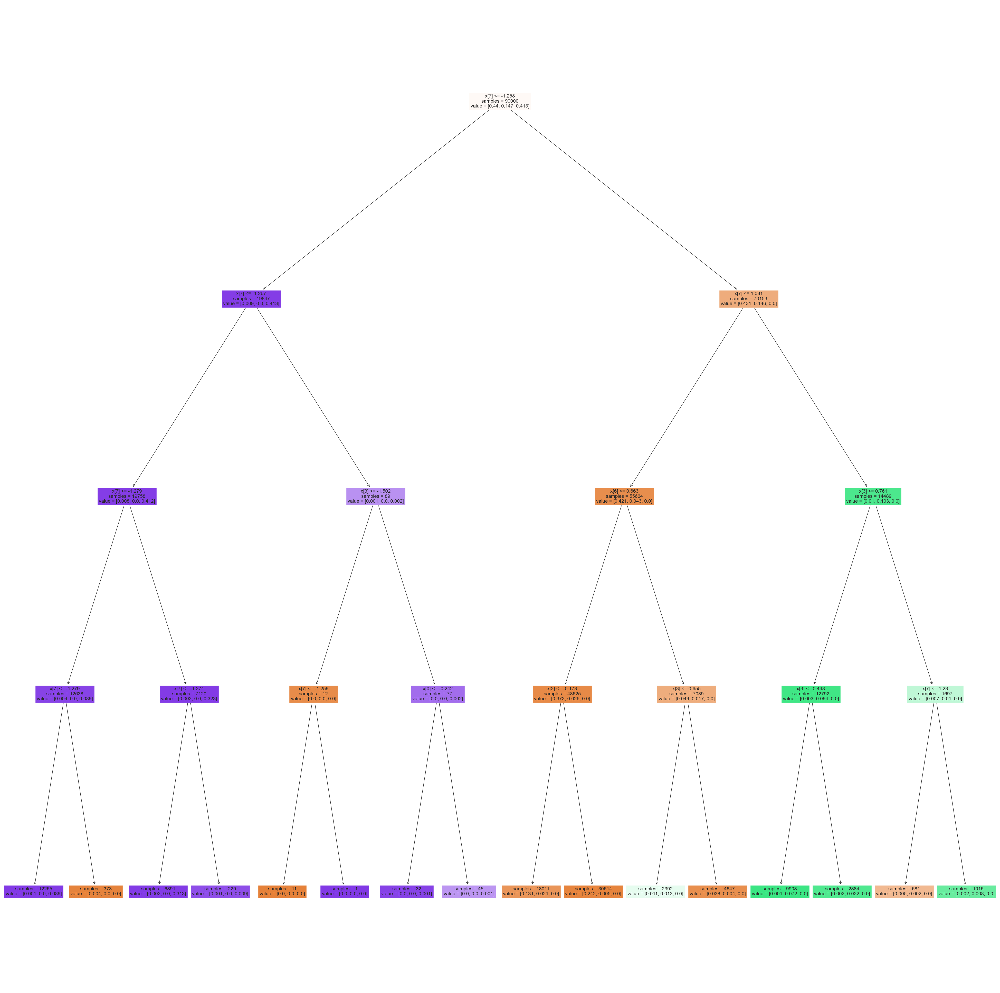

In [33]:
# visualizing ada boost random forest
from sklearn import tree
import matplotlib.pyplot as plt

## Setting the number of tree we want to show
num_trees_to_plot = 3 
count = 0


for dt_tree in ada_boost_model.estimators_:
    if count < num_trees_to_plot:    
        fig = plt.figure(figsize=(50, 50))  
        tree.plot_tree(dt_tree, filled=True, impurity=False)
        plt.show()  
        count += 1 

# Unsupervised Model

## K Means Clustering Model

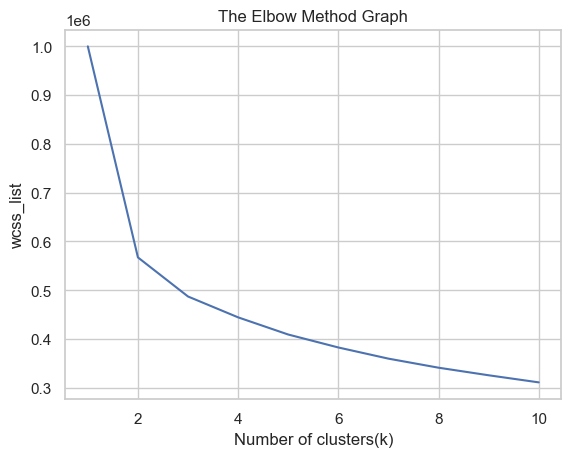

In [34]:

# Unsupervised model - K means clustering - tuning-k

from sklearn.cluster import KMeans

wcss = []  # Initializing the list for the values of ess

# Using for loop for iterations from 1 to 10.
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters(k)')
plt.ylabel('wcss_list')
plt.show()

/Users/jady/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Predicted Labels: [2 0 2 ... 1 2 0]
Performance Score: -487102.4399695163
Cluster Centers: 
 [[-9.83489391e-02  1.14490796e-01  3.24617690e-01  7.60119736e-01
   1.03478528e+00  1.10410973e+00  1.07061784e+00  8.96815808e-01
   1.06673107e+00  1.09892121e+00 -2.66453526e-15]
 [-7.37010420e-03 -6.82073923e-02 -1.02034857e+00 -1.16891262e+00
  -1.17620998e+00 -1.13398160e+00 -1.08726633e+00 -8.53667139e-01
  -9.75234062e-01 -9.68834630e-01  1.00000000e+00]
 [ 7.32898471e-02 -2.37691679e-02  5.95465494e-01  4.16171248e-01
   2.33837678e-01  1.52492454e-01  1.37993737e-01  6.98273591e-02
   5.08559283e-02  2.36718144e-02  2.00000000e+00]]


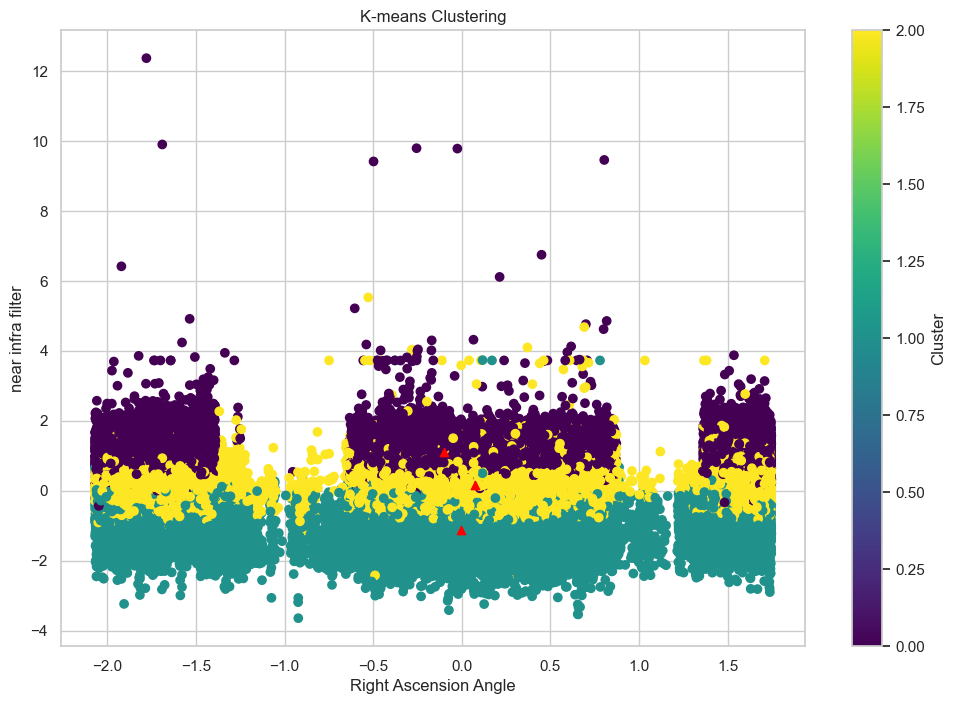

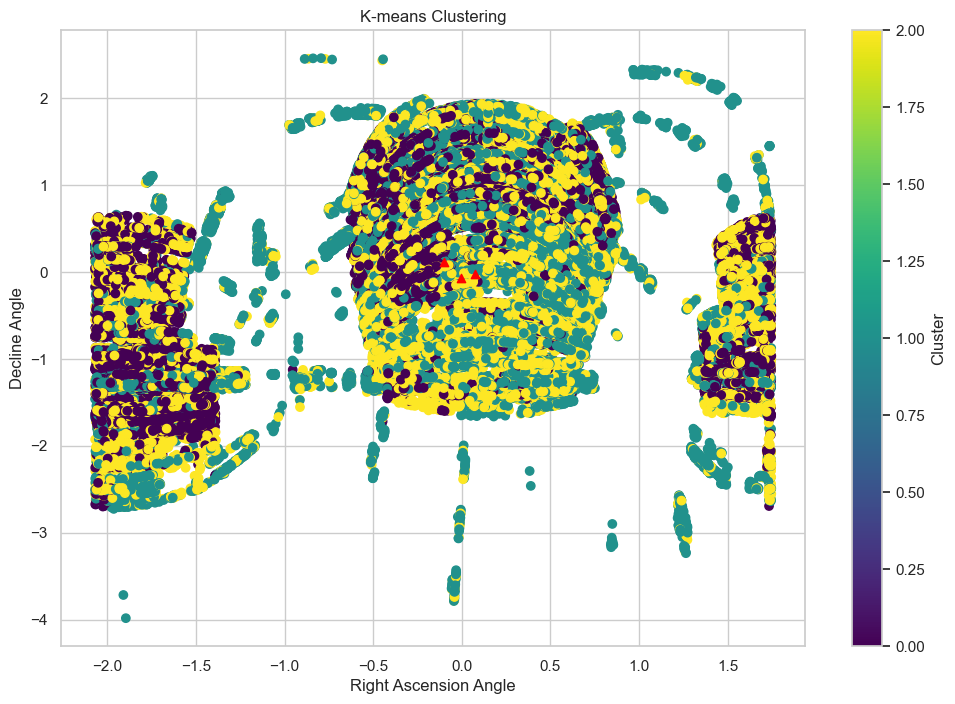

In [45]:
#Unsupervised model - K means clustering
from sklearn.cluster import KMeans

# S2: K-Means Clustering
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)

cls_predict = kmeans.predict(X)

print("Predicted Labels:", cls_predict)
print("Performance Score:", kmeans.score(X))
print("Cluster Centers: \n", kmeans.cluster_centers_)  

# Plotting the clusters - Figure A
plt.figure(figsize=(12, 8))
plt.scatter(X.iloc[:, 0], X.iloc[:, 5], c=cls_predict, cmap='viridis')
plt.xlabel('Right Ascension Angle')
plt.ylabel('near infra filter')
plt.title('K-means Clustering')
plt.colorbar(label='Cluster')
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 5], color='red', marker='^')
plt.show()

# Plotting the clusters - Figure B
plt.figure(figsize=(12, 8))
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=cls_predict, cmap='viridis')
plt.xlabel('Right Ascension Angle')
plt.ylabel('Decline Angle')
plt.title('K-means Clustering')
plt.colorbar(label='Cluster')
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], color='red', marker='^')
plt.show()


/Users/jady/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/c6/1h0zxljx7pj2pvy91xhq_6qw0000gn/T/ipykernel_47078/176933076.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['cluster_label'] = y_predict
/Users/jady/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


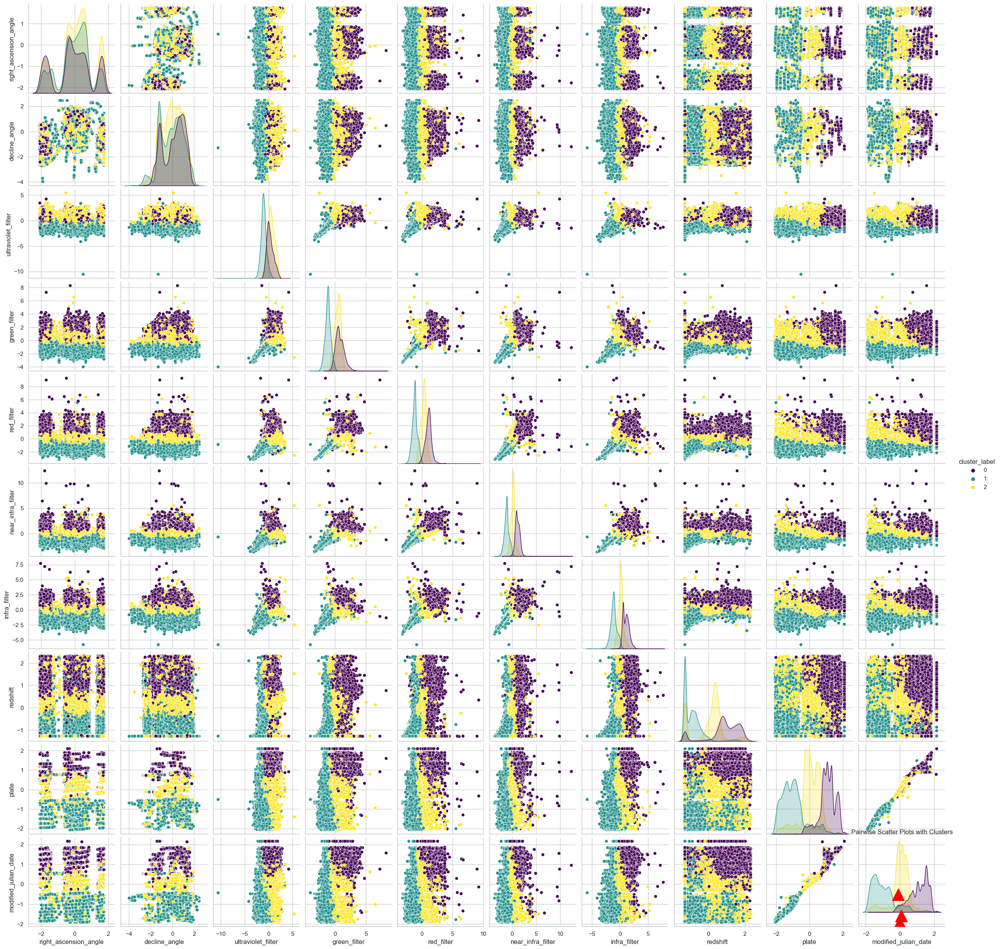

In [44]:
from sklearn.cluster import KMeans
Kmeans = KMeans(n_clusters = 3)
y_predict = kmeans.fit_predict(X)
# Add a new column to X for cluster labels (optional)
X['cluster_label'] = y_predict

# Visualizing the clusters with pairplot
sns.pairplot(X, hue='cluster_label', palette='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=500, 
            c='red', label='Centroid', marker='^')
plt.title('Pairwise Scatter Plots with Clusters')
plt.show()

# Accuracy Comparison

| Model              | Test Accuracy | Performance Score              |
|--------------------|---------------|--------------------------------|
| KNN Model          | 96.07%        | N/A                            |
| Decision Tree Model| 96.65%        | N/A                            |
| Random Forest      | 98.00%        | N/A                            |
| AdaBoost Model     | 81.00%        | N/A                            |
| K-Means Clustering | N/A           | -487102.456                    |


| Model            | Class      | Precision | Recall | F1-Score | Support |
|------------------|------------|-----------|--------|----------|---------|
| **KNN Model**    |    GALAXY  | 0.96      | 0.97   | 0.97     | 5904    |
|                  |    QSO     | 0.97      | 0.91   | 0.94     | 1887    |
|                  |    STAR    | 0.95      | 0.98   | 0.96     | 2209    |
|                  |  Accuracy  |           |        | 0.96     | 10000   |
|                  |  Macro Avg | 0.96      | 0.95   | 0.96     | 10000   |
|                  |Weighted Avg| 0.96      | 0.96   | 0.96     | 10000   |
| **Decision Tree**|    GALAXY  | 0.96      | 0.99   | 0.97     | 5904    |
|                  |    QSO     | 0.96      | 0.86   | 0.91     | 1887    |
|                  |    STAR    | 1.00      | 1.00   | 1.00     | 2209    |
|                  |  Accuracy  |           |        | 0.97     | 10000   |
|                  |  Macro Avg | 0.97      | 0.95   | 0.96     | 10000   |
|                  |Weighted Avg| 0.97      | 0.97   | 0.97     | 10000   |


| Model            | Class      | Precision | Recall | F1-Score | Support |
|------------------|------------|-----------|--------|----------|---------|
| **Random Forest**|    GALAXY  | 0.98      | 0.99   | 0.98     | 5904    |
|                  |    QSO     | 0.97      | 0.93   | 0.95     | 1887    |
|                  |    STAR    | 0.99      | 1.00   | 1.00     | 2209    |
|                  |  Accuracy  |           |        | 0.98     | 10000   |
|                  |  Macro Avg | 0.98      | 0.97   | 0.98     | 10000   |
|                  |Weighted Avg| 0.98      | 0.98   | 0.98     | 10000   |
| **AdaBoost**     |    GALAXY  | 0.98      | 0.99   | 0.98     | 5904    |
|                  |    QSO     | 0.97      | 0.93   | 0.95     | 1887    |
|                  |    STAR    | 0.99      | 1.00   | 1.00     | 2209    |
|                  |  Accuracy  |           |        | 0.98     | 10000   |
|                  |  Macro Avg | 0.98      | 0.97   | 0.98     | 10000   |
|                  |Weighted Avg| 0.98      | 0.98   | 0.98     | 10000   |
